In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
tf.experimental.numpy.experimental_enable_numpy_behavior()
from tensorflow.keras.models import load_model

In [4]:
# Define hyperparameters
EPOCHS = 50
BATCH_SIZE = 6
noise_dim = 256
num_examples_to_generate = 16

In [3]:
# os.remove("COVID/.amlignore")

In [4]:
# os.remove("COVID/.amlignore.amltmp")

In [5]:
covid_images_dir='COVID'


covidimages=[]
for i in os.listdir(covid_images_dir):
    image=cv2.imread(os.path.join(covid_images_dir,i))
    image=cv2.resize(image,(296,296))
    image=cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    image=(image-127.5)/127.5
    covidimages.append(image)


In [6]:
covidimages=np.array(covidimages)
covidimages=np.expand_dims(covidimages,axis=-1)
covidimages.shape

(3616, 296, 296, 1)

In [7]:
# Create a tf.data.Dataset object for the covid images
dataset = tf.data.Dataset.from_tensor_slices(covidimages)
dataset = dataset.shuffle(buffer_size=1024).batch(BATCH_SIZE)

2024-10-10 15:38:09.204165: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [2]:
def make_generator_model():
    model = keras.Sequential()
    model.add(layers.Input(shape=(noise_dim,)))


    model.add(layers.Dense(74 * 74 * 256, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())


    model.add(layers.Reshape((74, 74, 256)))
    print("Reshape Output:", model.output_shape)


    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    print("First Conv2DTranspose Output:", model.output_shape)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    print("Second Conv2DTranspose Output:", model.output_shape)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())


    model.add(layers.Conv2DTranspose(32, (3, 3), strides=(1, 1), padding='same', use_bias=False))
    print("Third Conv2DTranspose Output:", model.output_shape)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())


    model.add(layers.Conv2DTranspose(1, (3, 3), strides=(1, 1), padding='same', use_bias=False, activation='tanh'))
    print("Final Output:", model.output_shape)

    return model


In [9]:
def make_discriminator_model():
    model = keras.Sequential()

    # First Conv Layer: Downsample to (150, 150, 64)
    model.add(layers.Input(shape=(296, 296, 1)))
    model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
 

    # Second Conv Layer: Downsample to (75, 75, 128)
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
  
    # Third Conv Layer: Downsample to (37, 37, 256)
    model.add(layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
   

    # Fourth Conv Layer: Downsample to (18, 18, 512)
    model.add(layers.Conv2D(512, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
   

    # Flatten and output layer
    model.add(layers.Flatten())
    model.add(layers.Dense(1))  # Single output, typically used with sigmoid for binary classification

    return model


In [5]:
make_generator_model()

Reshape Output: (None, 74, 74, 256)
First Conv2DTranspose Output: (None, 148, 148, 128)
Second Conv2DTranspose Output: (None, 296, 296, 64)
Third Conv2DTranspose Output: (None, 296, 296, 32)
Final Output: (None, 296, 296, 1)


<Sequential name=sequential_1, built=True>

In [10]:
# unitializing generator and discriminator
generator = load_model('gener.keras')
discriminator = load_model('Discr.keras')

In [11]:
# Define the loss functions for the generator and discriminator
cross_entropy = keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [12]:
generator_optimizer = tf.optimizers.Adam(1e-4)  # exponent 0.0001
discriminator_optimizer = tf.optimizers.Adam(1e-4)

In [13]:
# Define the training loop
def train_step(images):
    # Generating noise from a normal distribution
    fake_img_noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(fake_img_noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
        generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))

        gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
        discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
        print("gen_loss" , np.mean(gen_loss))
        print("disc_loss" , np.mean(disc_loss))
        #print("gen_loss" , gen_loss)

In [14]:
# Train the GAN model
def train(dataset, epochs):
    for epoch in range(epochs):
        print(f'epoch number{epoch}')
        plt.imshow(generator(np.random.randn(1,256)).reshape(296,296),cmap='gray')
        plt.show()
        generator.save('gener.keras')
        discriminator.save('Discr.keras')
        # generator.save_weights('generator.weights.h5')
        # discriminator.save_weights('discriminator.weights.h5')
        for batch in dataset:
            train_step(batch)



epoch number0


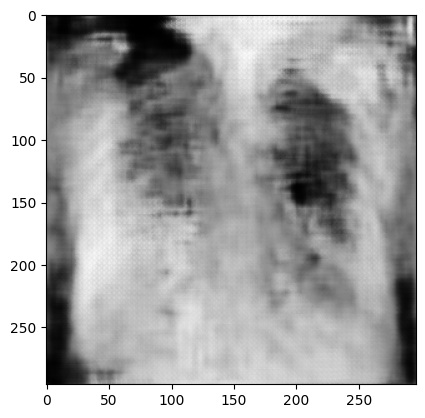

gen_loss tf.Tensor(2.521475, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8069049, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1967232, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8209698, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5986778, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5123892, shape=(), dtype=float32)
gen_loss tf.Tensor(1.3732657, shape=(), dtype=float32)
disc_loss tf.Tensor(0.39641696, shape=(), dtype=float32)
gen_loss tf.Tensor(3.4266522, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7463726, shape=(), dtype=float32)
gen_loss tf.Tensor(3.4326346, shape=(), dtype=float32)
disc_loss tf.Tensor(0.41336966, shape=(), dtype=float32)
gen_loss tf.Tensor(3.79879, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4099644, shape=(), dtype=float32)
gen_loss tf.Tensor(3.6990902, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6025533, shape=(), dtype=float32)
gen_loss tf.Tensor(2.7489033, shape=(), dtype=float32)
disc_loss tf.Tensor(0.22245757, shape=(), dtype=float32)
g

2024-10-10 16:56:50.086584: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


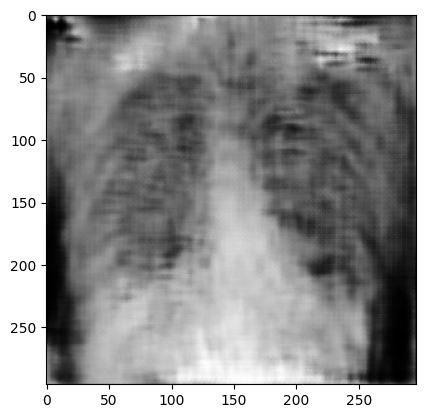

gen_loss tf.Tensor(3.4434566, shape=(), dtype=float32)
disc_loss tf.Tensor(1.2666354, shape=(), dtype=float32)
gen_loss tf.Tensor(3.5155563, shape=(), dtype=float32)
disc_loss tf.Tensor(0.25678056, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9953725, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3891608, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0160084, shape=(), dtype=float32)
disc_loss tf.Tensor(0.24346134, shape=(), dtype=float32)
gen_loss tf.Tensor(2.7016594, shape=(), dtype=float32)
disc_loss tf.Tensor(0.44699073, shape=(), dtype=float32)
gen_loss tf.Tensor(2.196664, shape=(), dtype=float32)
disc_loss tf.Tensor(0.41146225, shape=(), dtype=float32)
gen_loss tf.Tensor(2.37514, shape=(), dtype=float32)
disc_loss tf.Tensor(0.46312362, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3758745, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1750207, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3351228, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2288529, shape=(), dtype=float32)

2024-10-10 18:14:26.895642: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


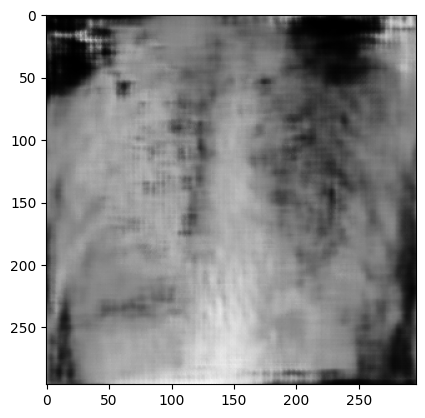

gen_loss tf.Tensor(3.2538192, shape=(), dtype=float32)
disc_loss tf.Tensor(0.08244637, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0976393, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8054738, shape=(), dtype=float32)
gen_loss tf.Tensor(1.4357833, shape=(), dtype=float32)
disc_loss tf.Tensor(0.92280257, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2926447, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4352476, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8774626, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6976221, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6314632, shape=(), dtype=float32)
disc_loss tf.Tensor(0.80701643, shape=(), dtype=float32)
gen_loss tf.Tensor(5.624148, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2657292, shape=(), dtype=float32)
gen_loss tf.Tensor(6.657753, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3145796, shape=(), dtype=float32)
gen_loss tf.Tensor(7.489701, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1790236, shape=(), dtype=float32)
g

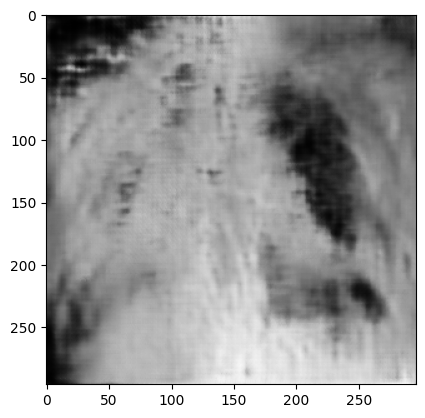

gen_loss tf.Tensor(4.2355266, shape=(), dtype=float32)
disc_loss tf.Tensor(0.9255793, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8923244, shape=(), dtype=float32)
disc_loss tf.Tensor(0.60639286, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0812562, shape=(), dtype=float32)
disc_loss tf.Tensor(0.59072775, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5312634, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3864408, shape=(), dtype=float32)
gen_loss tf.Tensor(0.7820051, shape=(), dtype=float32)
disc_loss tf.Tensor(0.81693643, shape=(), dtype=float32)
gen_loss tf.Tensor(0.8436446, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1404188, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4427729, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6284229, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0064256, shape=(), dtype=float32)
disc_loss tf.Tensor(0.9655608, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1765928, shape=(), dtype=float32)
disc_loss tf.Tensor(0.72409403, shape=(), dtype=float3

2024-10-10 20:50:53.346399: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


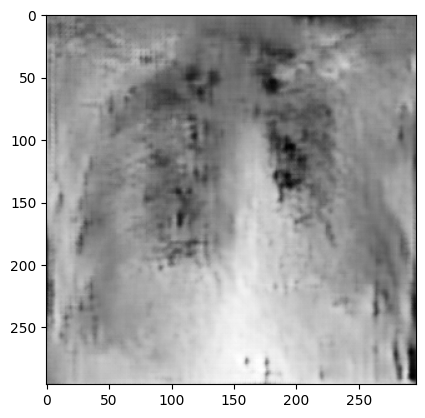

gen_loss tf.Tensor(3.3795273, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8485083, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1282055, shape=(), dtype=float32)
disc_loss tf.Tensor(0.28898245, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0464442, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2876633, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3282175, shape=(), dtype=float32)
disc_loss tf.Tensor(0.26780525, shape=(), dtype=float32)
gen_loss tf.Tensor(4.133417, shape=(), dtype=float32)
disc_loss tf.Tensor(2.4453938, shape=(), dtype=float32)
gen_loss tf.Tensor(3.4101226, shape=(), dtype=float32)
disc_loss tf.Tensor(0.26668596, shape=(), dtype=float32)
gen_loss tf.Tensor(2.387448, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27192035, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5742348, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4807004, shape=(), dtype=float32)
gen_loss tf.Tensor(2.384966, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2712142, shape=(), dtype=float32)


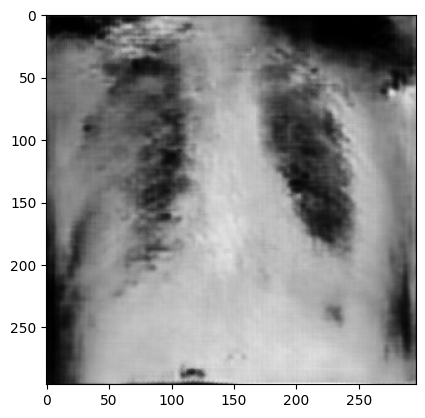

gen_loss tf.Tensor(4.199243, shape=(), dtype=float32)
disc_loss tf.Tensor(2.2352295, shape=(), dtype=float32)
gen_loss tf.Tensor(4.228431, shape=(), dtype=float32)
disc_loss tf.Tensor(0.55333537, shape=(), dtype=float32)
gen_loss tf.Tensor(3.024133, shape=(), dtype=float32)
disc_loss tf.Tensor(1.030785, shape=(), dtype=float32)
gen_loss tf.Tensor(3.516138, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6588487, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2717469, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7432781, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7009524, shape=(), dtype=float32)
disc_loss tf.Tensor(0.504567, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6865749, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1986715, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7094904, shape=(), dtype=float32)
disc_loss tf.Tensor(0.48440886, shape=(), dtype=float32)
gen_loss tf.Tensor(0.8209323, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7120432, shape=(), dtype=float32)
gen_l

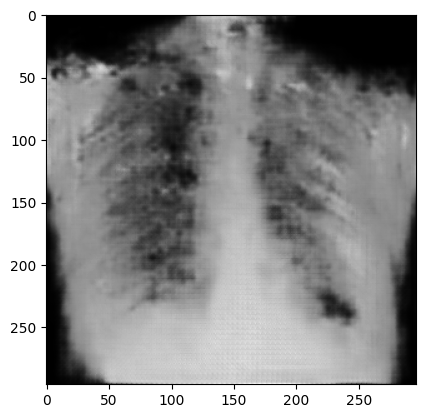

gen_loss tf.Tensor(2.250583, shape=(), dtype=float32)
disc_loss tf.Tensor(0.31519017, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1578424, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3622948, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3408787, shape=(), dtype=float32)
disc_loss tf.Tensor(0.52826506, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1010315, shape=(), dtype=float32)
disc_loss tf.Tensor(0.63601166, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3651838, shape=(), dtype=float32)
disc_loss tf.Tensor(0.14478569, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3719442, shape=(), dtype=float32)
disc_loss tf.Tensor(0.22191241, shape=(), dtype=float32)
gen_loss tf.Tensor(4.303826, shape=(), dtype=float32)
disc_loss tf.Tensor(0.047940798, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5125053, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5505793, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8764055, shape=(), dtype=float32)
disc_loss tf.Tensor(1.8990164, shape=(), dtype=float

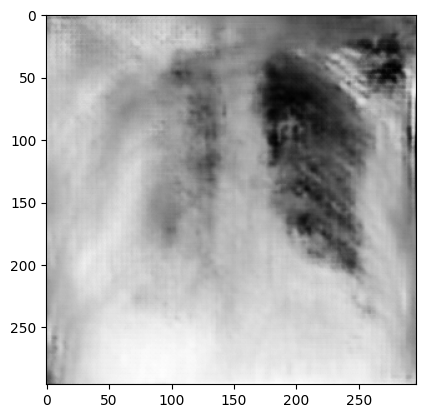

gen_loss tf.Tensor(3.1294262, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5322361, shape=(), dtype=float32)
gen_loss tf.Tensor(5.1119647, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6188108, shape=(), dtype=float32)
gen_loss tf.Tensor(3.6200275, shape=(), dtype=float32)
disc_loss tf.Tensor(0.626969, shape=(), dtype=float32)
gen_loss tf.Tensor(3.9707477, shape=(), dtype=float32)
disc_loss tf.Tensor(0.59062725, shape=(), dtype=float32)
gen_loss tf.Tensor(3.4986718, shape=(), dtype=float32)
disc_loss tf.Tensor(0.270382, shape=(), dtype=float32)
gen_loss tf.Tensor(2.7721918, shape=(), dtype=float32)
disc_loss tf.Tensor(0.23052034, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6779251, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5288905, shape=(), dtype=float32)
gen_loss tf.Tensor(2.183916, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5746058, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8964982, shape=(), dtype=float32)
disc_loss tf.Tensor(0.47185785, shape=(), dtype=float32)
g

2024-10-11 02:02:34.220494: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


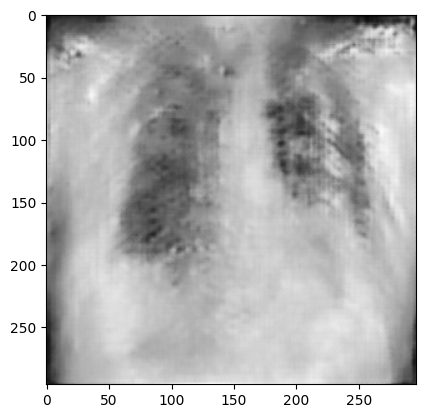

gen_loss tf.Tensor(3.105338, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1307225, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7908376, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3455681, shape=(), dtype=float32)
gen_loss tf.Tensor(2.308731, shape=(), dtype=float32)
disc_loss tf.Tensor(0.98571527, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1641648, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6749655, shape=(), dtype=float32)
gen_loss tf.Tensor(1.0661398, shape=(), dtype=float32)
disc_loss tf.Tensor(0.9265159, shape=(), dtype=float32)
gen_loss tf.Tensor(2.740593, shape=(), dtype=float32)
disc_loss tf.Tensor(0.64847964, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6034076, shape=(), dtype=float32)
disc_loss tf.Tensor(0.9583093, shape=(), dtype=float32)
gen_loss tf.Tensor(2.376985, shape=(), dtype=float32)
disc_loss tf.Tensor(0.32769835, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2731915, shape=(), dtype=float32)
disc_loss tf.Tensor(0.40819204, shape=(), dtype=float32)
g

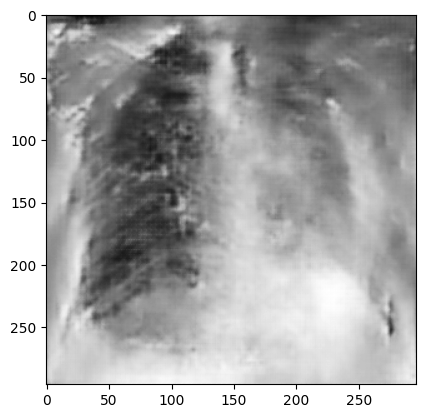

gen_loss tf.Tensor(3.5350883, shape=(), dtype=float32)
disc_loss tf.Tensor(0.45666164, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0508797, shape=(), dtype=float32)
disc_loss tf.Tensor(1.6251196, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6824096, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3345345, shape=(), dtype=float32)
gen_loss tf.Tensor(1.0302039, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8210365, shape=(), dtype=float32)
gen_loss tf.Tensor(1.3556027, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6466678, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6416078, shape=(), dtype=float32)
disc_loss tf.Tensor(0.75634664, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7803003, shape=(), dtype=float32)
disc_loss tf.Tensor(0.91689646, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8431795, shape=(), dtype=float32)
disc_loss tf.Tensor(0.92860454, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1546457, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7188139, shape=(), dtype=float3

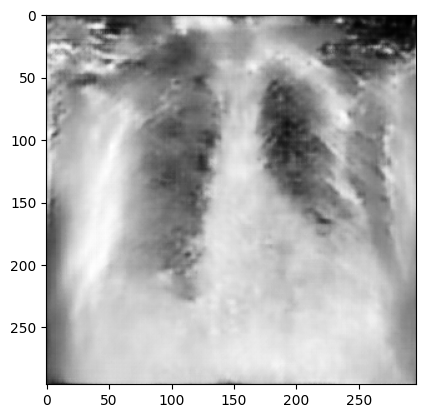

gen_loss tf.Tensor(5.148197, shape=(), dtype=float32)
disc_loss tf.Tensor(0.29690984, shape=(), dtype=float32)
gen_loss tf.Tensor(5.997682, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8241288, shape=(), dtype=float32)
gen_loss tf.Tensor(4.2958207, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27966148, shape=(), dtype=float32)
gen_loss tf.Tensor(3.5364602, shape=(), dtype=float32)
disc_loss tf.Tensor(1.5832423, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6950963, shape=(), dtype=float32)
disc_loss tf.Tensor(0.37791726, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7485265, shape=(), dtype=float32)
disc_loss tf.Tensor(1.5026221, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5889953, shape=(), dtype=float32)
disc_loss tf.Tensor(0.59035623, shape=(), dtype=float32)
gen_loss tf.Tensor(0.81520635, shape=(), dtype=float32)
disc_loss tf.Tensor(1.2564329, shape=(), dtype=float32)
gen_loss tf.Tensor(0.66722494, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1090505, shape=(), dtype=float3

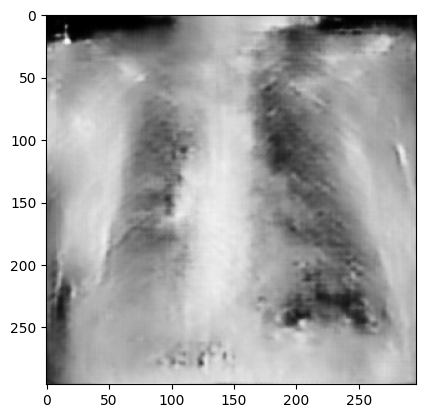

gen_loss tf.Tensor(3.3415325, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5912785, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5972407, shape=(), dtype=float32)
disc_loss tf.Tensor(1.6920432, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8393214, shape=(), dtype=float32)
disc_loss tf.Tensor(0.90701795, shape=(), dtype=float32)
gen_loss tf.Tensor(3.043544, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0095327, shape=(), dtype=float32)
gen_loss tf.Tensor(2.34111, shape=(), dtype=float32)
disc_loss tf.Tensor(0.40700734, shape=(), dtype=float32)
gen_loss tf.Tensor(2.016995, shape=(), dtype=float32)
disc_loss tf.Tensor(0.52504265, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5408239, shape=(), dtype=float32)
disc_loss tf.Tensor(0.51324224, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6316282, shape=(), dtype=float32)
disc_loss tf.Tensor(1.6051745, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0559814, shape=(), dtype=float32)
disc_loss tf.Tensor(0.17799127, shape=(), dtype=float32)


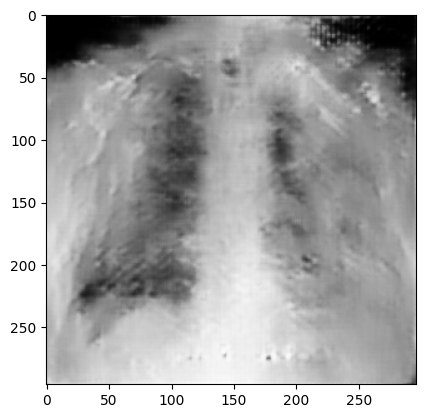

gen_loss tf.Tensor(2.6196554, shape=(), dtype=float32)
disc_loss tf.Tensor(0.1705119, shape=(), dtype=float32)
gen_loss tf.Tensor(2.226206, shape=(), dtype=float32)
disc_loss tf.Tensor(0.19658291, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3344052, shape=(), dtype=float32)
disc_loss tf.Tensor(0.46247286, shape=(), dtype=float32)
gen_loss tf.Tensor(2.390581, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5670493, shape=(), dtype=float32)
gen_loss tf.Tensor(2.7934983, shape=(), dtype=float32)
disc_loss tf.Tensor(0.38867447, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3495388, shape=(), dtype=float32)
disc_loss tf.Tensor(0.99222934, shape=(), dtype=float32)
gen_loss tf.Tensor(2.315604, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6324028, shape=(), dtype=float32)
gen_loss tf.Tensor(3.069524, shape=(), dtype=float32)
disc_loss tf.Tensor(0.12073837, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9741392, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0258889, shape=(), dtype=float32)


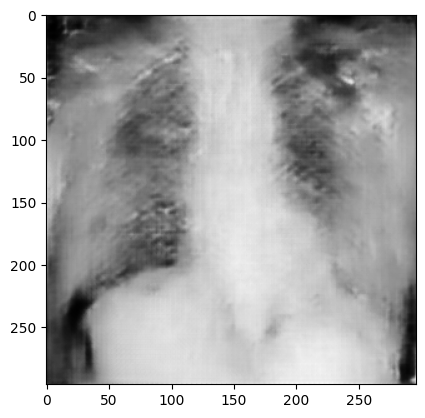

gen_loss tf.Tensor(3.5576649, shape=(), dtype=float32)
disc_loss tf.Tensor(0.38208207, shape=(), dtype=float32)
gen_loss tf.Tensor(4.2054124, shape=(), dtype=float32)
disc_loss tf.Tensor(0.46456352, shape=(), dtype=float32)
gen_loss tf.Tensor(4.816632, shape=(), dtype=float32)
disc_loss tf.Tensor(1.6222675, shape=(), dtype=float32)
gen_loss tf.Tensor(3.9228077, shape=(), dtype=float32)
disc_loss tf.Tensor(0.21483624, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7696568, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2621151, shape=(), dtype=float32)
gen_loss tf.Tensor(1.363737, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5429026, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7126278, shape=(), dtype=float32)
disc_loss tf.Tensor(0.30590528, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1315424, shape=(), dtype=float32)
disc_loss tf.Tensor(0.53129333, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1561325, shape=(), dtype=float32)
disc_loss tf.Tensor(0.20095338, shape=(), dtype=float3

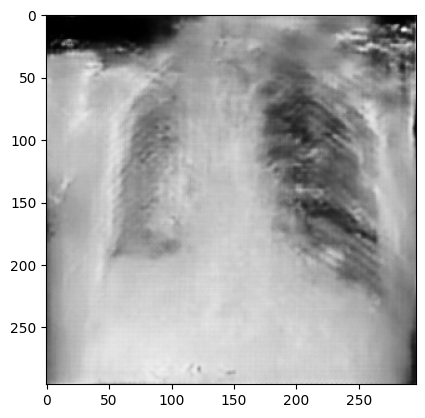

gen_loss tf.Tensor(5.2090306, shape=(), dtype=float32)
disc_loss tf.Tensor(0.1579108, shape=(), dtype=float32)
gen_loss tf.Tensor(4.7649693, shape=(), dtype=float32)
disc_loss tf.Tensor(2.5634248, shape=(), dtype=float32)
gen_loss tf.Tensor(4.377824, shape=(), dtype=float32)
disc_loss tf.Tensor(0.07891254, shape=(), dtype=float32)
gen_loss tf.Tensor(3.4355333, shape=(), dtype=float32)
disc_loss tf.Tensor(0.69209164, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5396338, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27438626, shape=(), dtype=float32)
gen_loss tf.Tensor(1.671523, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2996422, shape=(), dtype=float32)
gen_loss tf.Tensor(1.3666657, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5114986, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5901251, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5405294, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7218566, shape=(), dtype=float32)
disc_loss tf.Tensor(0.40885565, shape=(), dtype=float32)

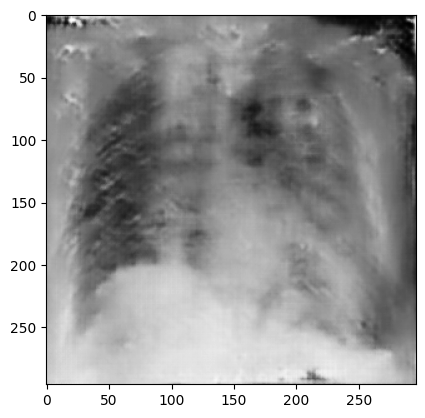

gen_loss tf.Tensor(3.816044, shape=(), dtype=float32)
disc_loss tf.Tensor(0.836421, shape=(), dtype=float32)
gen_loss tf.Tensor(4.0913343, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5392619, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8989239, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27335194, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1387656, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8671506, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8653036, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5689906, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1563056, shape=(), dtype=float32)
disc_loss tf.Tensor(0.14176731, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9214413, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3970813, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8292874, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7286925, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9144229, shape=(), dtype=float32)
disc_loss tf.Tensor(0.41234115, shape=(), dtype=float32)


2024-10-11 12:25:48.191639: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


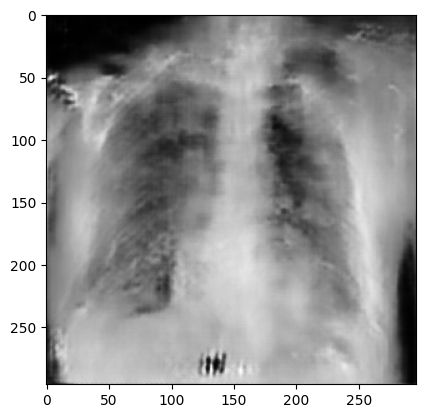

gen_loss tf.Tensor(4.3272853, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7599745, shape=(), dtype=float32)
gen_loss tf.Tensor(4.241126, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6062875, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8789551, shape=(), dtype=float32)
disc_loss tf.Tensor(0.43195242, shape=(), dtype=float32)
gen_loss tf.Tensor(3.116452, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5165032, shape=(), dtype=float32)
gen_loss tf.Tensor(2.433983, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6853103, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9255897, shape=(), dtype=float32)
disc_loss tf.Tensor(0.37338924, shape=(), dtype=float32)
gen_loss tf.Tensor(0.86423653, shape=(), dtype=float32)
disc_loss tf.Tensor(0.85236275, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8231468, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3380413, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5077207, shape=(), dtype=float32)
disc_loss tf.Tensor(0.28271124, shape=(), dtype=float32)

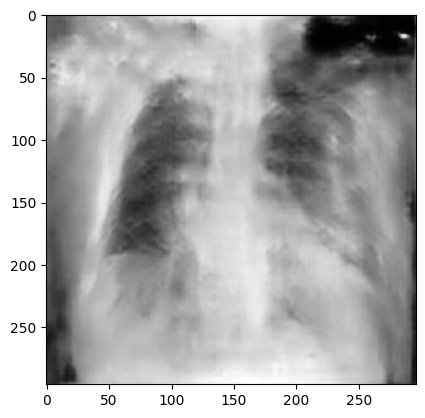

gen_loss tf.Tensor(2.0450277, shape=(), dtype=float32)
disc_loss tf.Tensor(1.4802103, shape=(), dtype=float32)
gen_loss tf.Tensor(1.4442676, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7864799, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7969347, shape=(), dtype=float32)
disc_loss tf.Tensor(0.53668094, shape=(), dtype=float32)
gen_loss tf.Tensor(3.7064238, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2962537, shape=(), dtype=float32)
gen_loss tf.Tensor(4.7728276, shape=(), dtype=float32)
disc_loss tf.Tensor(0.43144438, shape=(), dtype=float32)
gen_loss tf.Tensor(3.8758404, shape=(), dtype=float32)
disc_loss tf.Tensor(0.14300945, shape=(), dtype=float32)
gen_loss tf.Tensor(4.218041, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27848557, shape=(), dtype=float32)
gen_loss tf.Tensor(3.8927472, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3739158, shape=(), dtype=float32)
gen_loss tf.Tensor(4.383841, shape=(), dtype=float32)
disc_loss tf.Tensor(0.14291714, shape=(), dtype=float32

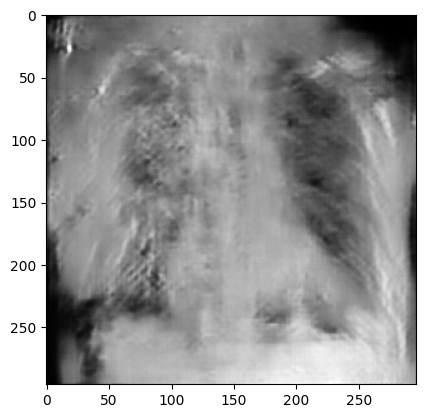

gen_loss tf.Tensor(3.302337, shape=(), dtype=float32)
disc_loss tf.Tensor(0.59950215, shape=(), dtype=float32)
gen_loss tf.Tensor(4.303692, shape=(), dtype=float32)
disc_loss tf.Tensor(0.83289474, shape=(), dtype=float32)
gen_loss tf.Tensor(3.6463223, shape=(), dtype=float32)
disc_loss tf.Tensor(0.64357775, shape=(), dtype=float32)
gen_loss tf.Tensor(3.020749, shape=(), dtype=float32)
disc_loss tf.Tensor(0.69020027, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7712663, shape=(), dtype=float32)
disc_loss tf.Tensor(0.30117252, shape=(), dtype=float32)
gen_loss tf.Tensor(1.2383881, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8393191, shape=(), dtype=float32)
gen_loss tf.Tensor(1.316698, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6101899, shape=(), dtype=float32)
gen_loss tf.Tensor(1.0367662, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7976702, shape=(), dtype=float32)
gen_loss tf.Tensor(0.7913134, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7116494, shape=(), dtype=float32)


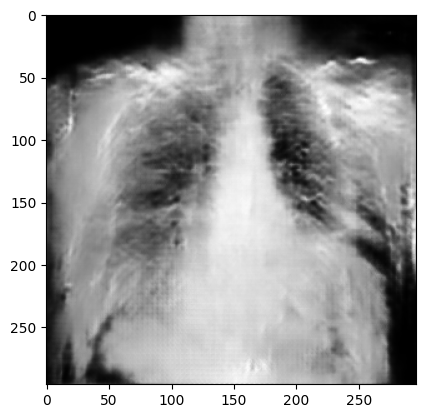

gen_loss tf.Tensor(1.8886777, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4383071, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8146766, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4097977, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7898136, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27519733, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3350859, shape=(), dtype=float32)
disc_loss tf.Tensor(2.6067977, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4174955, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3957568, shape=(), dtype=float32)
gen_loss tf.Tensor(1.88762, shape=(), dtype=float32)
disc_loss tf.Tensor(0.53666186, shape=(), dtype=float32)
gen_loss tf.Tensor(1.4800944, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0842934, shape=(), dtype=float32)
gen_loss tf.Tensor(0.9854459, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8954992, shape=(), dtype=float32)
gen_loss tf.Tensor(0.97384804, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8721622, shape=(), dtype=float32)


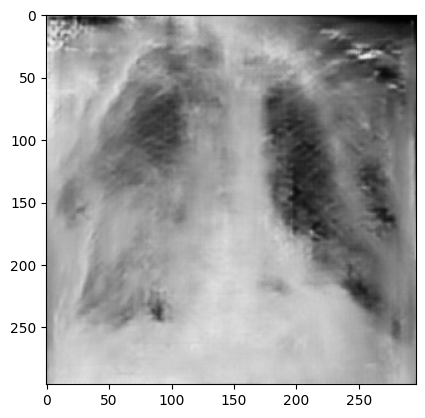

gen_loss tf.Tensor(2.3543627, shape=(), dtype=float32)
disc_loss tf.Tensor(0.38794607, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6483746, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5129116, shape=(), dtype=float32)
gen_loss tf.Tensor(2.201228, shape=(), dtype=float32)
disc_loss tf.Tensor(0.33918938, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9287913, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3492508, shape=(), dtype=float32)
gen_loss tf.Tensor(2.249131, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6075131, shape=(), dtype=float32)
gen_loss tf.Tensor(3.4053543, shape=(), dtype=float32)
disc_loss tf.Tensor(0.81111103, shape=(), dtype=float32)
gen_loss tf.Tensor(2.293567, shape=(), dtype=float32)
disc_loss tf.Tensor(0.23198557, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0376856, shape=(), dtype=float32)
disc_loss tf.Tensor(0.28846514, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4511974, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2660679, shape=(), dtype=float32)

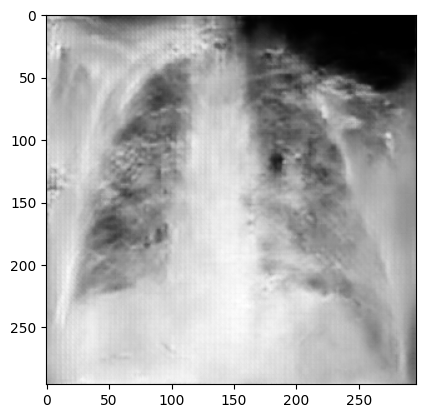

gen_loss tf.Tensor(2.0611224, shape=(), dtype=float32)
disc_loss tf.Tensor(0.36249334, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6270981, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0240397, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5736134, shape=(), dtype=float32)
disc_loss tf.Tensor(0.97239375, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0896003, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3724189, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3027716, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27136022, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6658273, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5728442, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1044223, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6056297, shape=(), dtype=float32)
gen_loss tf.Tensor(3.068065, shape=(), dtype=float32)
disc_loss tf.Tensor(0.54691046, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1709647, shape=(), dtype=float32)
disc_loss tf.Tensor(0.28984648, shape=(), dtype=float3

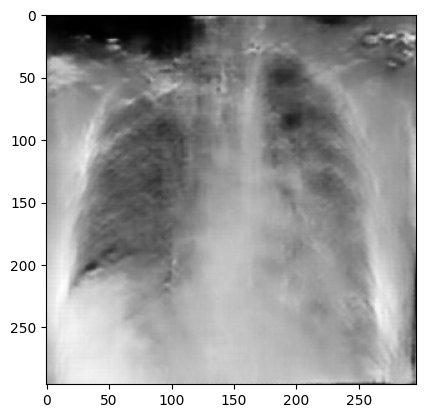

gen_loss tf.Tensor(3.4944756, shape=(), dtype=float32)
disc_loss tf.Tensor(0.058212116, shape=(), dtype=float32)
gen_loss tf.Tensor(4.4581237, shape=(), dtype=float32)
disc_loss tf.Tensor(0.9635182, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3632355, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1489933, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9827725, shape=(), dtype=float32)
disc_loss tf.Tensor(1.4329865, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9650341, shape=(), dtype=float32)
disc_loss tf.Tensor(0.17468202, shape=(), dtype=float32)
gen_loss tf.Tensor(0.76327854, shape=(), dtype=float32)
disc_loss tf.Tensor(0.893519, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8389648, shape=(), dtype=float32)
disc_loss tf.Tensor(0.26348722, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0025756, shape=(), dtype=float32)
disc_loss tf.Tensor(0.22255777, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2633798, shape=(), dtype=float32)
disc_loss tf.Tensor(0.28942293, shape=(), dtype=floa

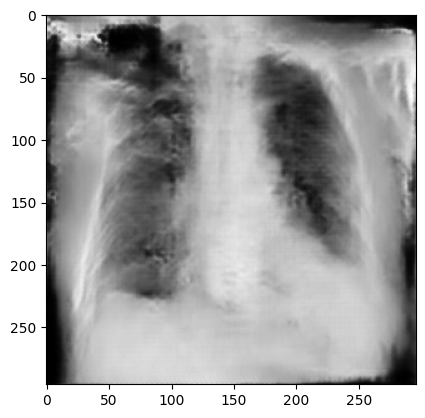

gen_loss tf.Tensor(3.5552003, shape=(), dtype=float32)
disc_loss tf.Tensor(0.08546286, shape=(), dtype=float32)
gen_loss tf.Tensor(2.425262, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3006571, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0967684, shape=(), dtype=float32)
disc_loss tf.Tensor(1.2457838, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8648844, shape=(), dtype=float32)
disc_loss tf.Tensor(0.12227262, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4195151, shape=(), dtype=float32)
disc_loss tf.Tensor(0.17525823, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1495295, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6608467, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3044782, shape=(), dtype=float32)
disc_loss tf.Tensor(0.68061626, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8286276, shape=(), dtype=float32)
disc_loss tf.Tensor(0.37240034, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3034558, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3760059, shape=(), dtype=float3

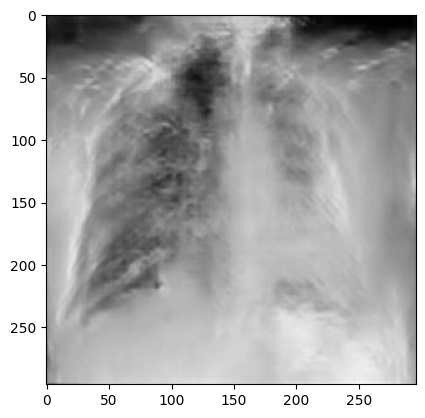

gen_loss tf.Tensor(2.1389596, shape=(), dtype=float32)
disc_loss tf.Tensor(0.19938102, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4089727, shape=(), dtype=float32)
disc_loss tf.Tensor(0.54769063, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2158031, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4494468, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2687254, shape=(), dtype=float32)
disc_loss tf.Tensor(1.2167028, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6114917, shape=(), dtype=float32)
disc_loss tf.Tensor(0.32328576, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4423015, shape=(), dtype=float32)
disc_loss tf.Tensor(0.48480958, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9080331, shape=(), dtype=float32)
disc_loss tf.Tensor(0.77604717, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9303818, shape=(), dtype=float32)
disc_loss tf.Tensor(0.08707363, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5561814, shape=(), dtype=float32)
disc_loss tf.Tensor(0.44318712, shape=(), dtype=flo

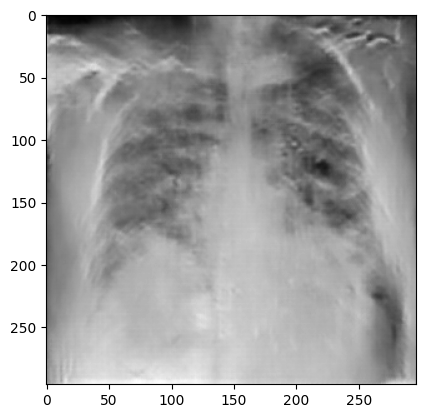

gen_loss tf.Tensor(3.582166, shape=(), dtype=float32)
disc_loss tf.Tensor(0.9255636, shape=(), dtype=float32)
gen_loss tf.Tensor(3.6054668, shape=(), dtype=float32)
disc_loss tf.Tensor(0.15333813, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6340413, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2566867, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0124528, shape=(), dtype=float32)
disc_loss tf.Tensor(0.29818666, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7596315, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7802164, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9438912, shape=(), dtype=float32)
disc_loss tf.Tensor(0.52089477, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5602365, shape=(), dtype=float32)
disc_loss tf.Tensor(1.2782512, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9124374, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27004617, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1258793, shape=(), dtype=float32)
disc_loss tf.Tensor(0.088957936, shape=(), dtype=float

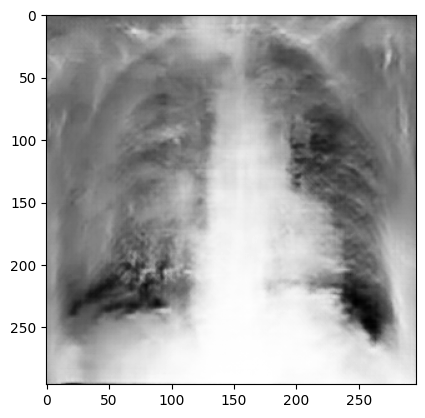

gen_loss tf.Tensor(3.5547507, shape=(), dtype=float32)
disc_loss tf.Tensor(0.04092666, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9547865, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3612868, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0533235, shape=(), dtype=float32)
disc_loss tf.Tensor(0.13657467, shape=(), dtype=float32)
gen_loss tf.Tensor(2.849803, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8087462, shape=(), dtype=float32)
gen_loss tf.Tensor(3.047416, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3183937, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6971636, shape=(), dtype=float32)
disc_loss tf.Tensor(0.91851395, shape=(), dtype=float32)
gen_loss tf.Tensor(2.7361965, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8860043, shape=(), dtype=float32)
gen_loss tf.Tensor(3.8093252, shape=(), dtype=float32)
disc_loss tf.Tensor(0.06140487, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5312052, shape=(), dtype=float32)
disc_loss tf.Tensor(0.38543326, shape=(), dtype=float32

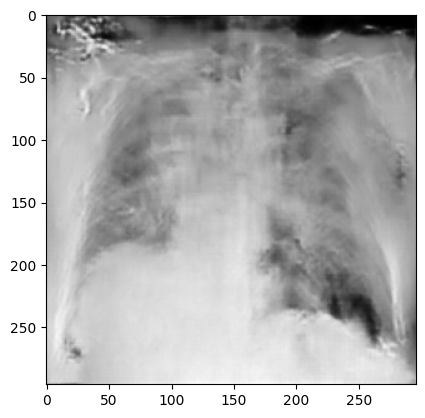

gen_loss tf.Tensor(2.5797498, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3847822, shape=(), dtype=float32)
gen_loss tf.Tensor(1.852519, shape=(), dtype=float32)
disc_loss tf.Tensor(0.52379346, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5284448, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3242029, shape=(), dtype=float32)
gen_loss tf.Tensor(2.7218351, shape=(), dtype=float32)
disc_loss tf.Tensor(0.73862803, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6543145, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6026562, shape=(), dtype=float32)
gen_loss tf.Tensor(2.533744, shape=(), dtype=float32)
disc_loss tf.Tensor(0.507012, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6130662, shape=(), dtype=float32)
disc_loss tf.Tensor(0.34550598, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2073195, shape=(), dtype=float32)
disc_loss tf.Tensor(0.34615073, shape=(), dtype=float32)
gen_loss tf.Tensor(2.475284, shape=(), dtype=float32)
disc_loss tf.Tensor(0.419302, shape=(), dtype=float32)
ge

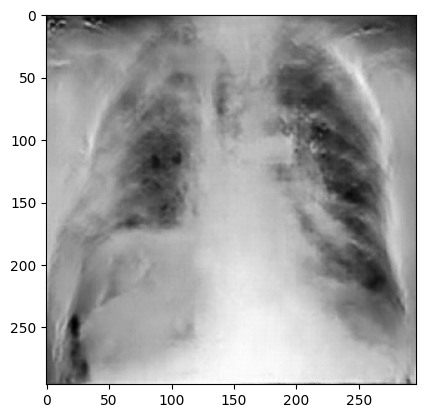

gen_loss tf.Tensor(3.5652258, shape=(), dtype=float32)
disc_loss tf.Tensor(1.2425274, shape=(), dtype=float32)
gen_loss tf.Tensor(4.73637, shape=(), dtype=float32)
disc_loss tf.Tensor(0.12654597, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3594415, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1131961, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6248417, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5875938, shape=(), dtype=float32)
gen_loss tf.Tensor(1.4318581, shape=(), dtype=float32)
disc_loss tf.Tensor(0.87283146, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5455376, shape=(), dtype=float32)
disc_loss tf.Tensor(0.43381065, shape=(), dtype=float32)
gen_loss tf.Tensor(1.2011851, shape=(), dtype=float32)
disc_loss tf.Tensor(0.76004875, shape=(), dtype=float32)
gen_loss tf.Tensor(1.2675375, shape=(), dtype=float32)
disc_loss tf.Tensor(0.45949015, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4661822, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3111417, shape=(), dtype=float32

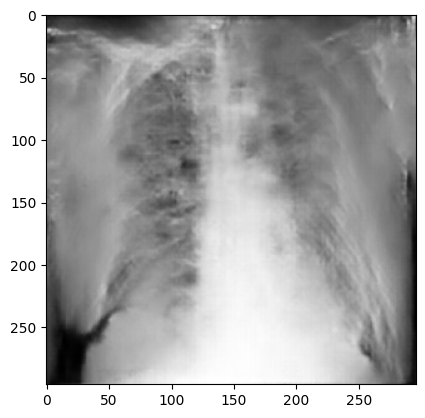

gen_loss tf.Tensor(3.3834355, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3283741, shape=(), dtype=float32)
gen_loss tf.Tensor(3.6542256, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7516065, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0658302, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27840555, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0081508, shape=(), dtype=float32)
disc_loss tf.Tensor(0.08146413, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1638203, shape=(), dtype=float32)
disc_loss tf.Tensor(0.29234484, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6983767, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0640628, shape=(), dtype=float32)
gen_loss tf.Tensor(2.711158, shape=(), dtype=float32)
disc_loss tf.Tensor(1.5826957, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5346942, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8214886, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2338958, shape=(), dtype=float32)
disc_loss tf.Tensor(0.40844876, shape=(), dtype=float32

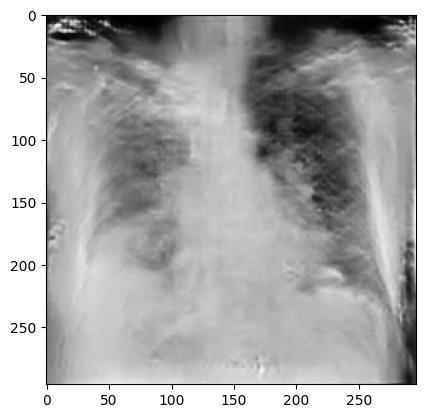

gen_loss tf.Tensor(2.672125, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7029704, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6077063, shape=(), dtype=float32)
disc_loss tf.Tensor(0.12346366, shape=(), dtype=float32)
gen_loss tf.Tensor(1.996593, shape=(), dtype=float32)
disc_loss tf.Tensor(0.63150674, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8344015, shape=(), dtype=float32)
disc_loss tf.Tensor(0.34867644, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9257121, shape=(), dtype=float32)
disc_loss tf.Tensor(0.9176016, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5464596, shape=(), dtype=float32)
disc_loss tf.Tensor(0.39839023, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0127661, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4249584, shape=(), dtype=float32)
gen_loss tf.Tensor(3.118414, shape=(), dtype=float32)
disc_loss tf.Tensor(0.18545562, shape=(), dtype=float32)
gen_loss tf.Tensor(3.474455, shape=(), dtype=float32)
disc_loss tf.Tensor(0.20528698, shape=(), dtype=float32)

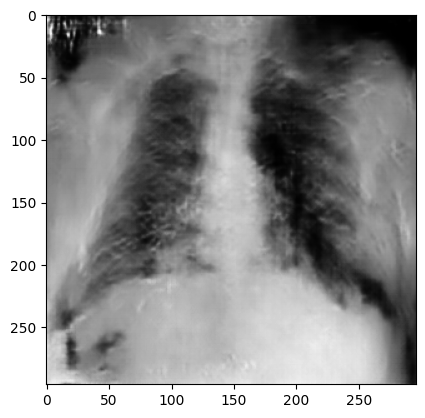

gen_loss tf.Tensor(5.023127, shape=(), dtype=float32)
disc_loss tf.Tensor(1.670326, shape=(), dtype=float32)
gen_loss tf.Tensor(3.8786497, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4337198, shape=(), dtype=float32)
gen_loss tf.Tensor(2.759712, shape=(), dtype=float32)
disc_loss tf.Tensor(0.22440949, shape=(), dtype=float32)
gen_loss tf.Tensor(2.061335, shape=(), dtype=float32)
disc_loss tf.Tensor(0.89440686, shape=(), dtype=float32)
gen_loss tf.Tensor(1.1343623, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6076578, shape=(), dtype=float32)
gen_loss tf.Tensor(1.1573256, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8391212, shape=(), dtype=float32)
gen_loss tf.Tensor(1.3225744, shape=(), dtype=float32)
disc_loss tf.Tensor(0.71494055, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1741004, shape=(), dtype=float32)
disc_loss tf.Tensor(0.24805687, shape=(), dtype=float32)
gen_loss tf.Tensor(2.906824, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5964119, shape=(), dtype=float32)
ge

2024-10-12 09:26:07.981886: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


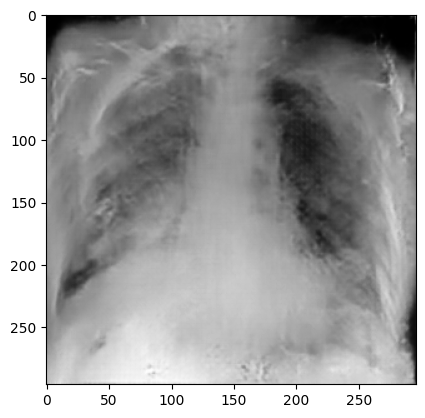

gen_loss tf.Tensor(3.379652, shape=(), dtype=float32)
disc_loss tf.Tensor(1.111852, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9114804, shape=(), dtype=float32)
disc_loss tf.Tensor(0.39148617, shape=(), dtype=float32)
gen_loss tf.Tensor(1.4081583, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3454112, shape=(), dtype=float32)
gen_loss tf.Tensor(1.532608, shape=(), dtype=float32)
disc_loss tf.Tensor(0.37726438, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8926476, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3471192, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4558346, shape=(), dtype=float32)
disc_loss tf.Tensor(0.245386, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6705285, shape=(), dtype=float32)
disc_loss tf.Tensor(0.51932937, shape=(), dtype=float32)
gen_loss tf.Tensor(2.490846, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0340841, shape=(), dtype=float32)
gen_loss tf.Tensor(2.92159, shape=(), dtype=float32)
disc_loss tf.Tensor(0.25524843, shape=(), dtype=float32)
gen_

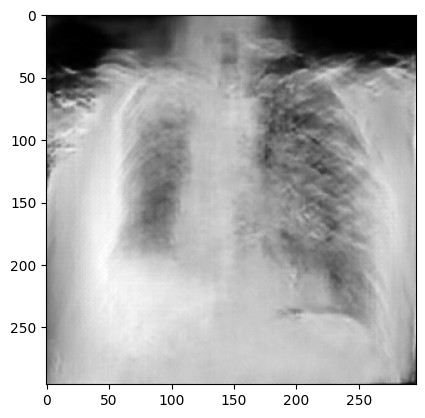

gen_loss tf.Tensor(3.2993011, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0184045, shape=(), dtype=float32)
gen_loss tf.Tensor(3.483966, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6598282, shape=(), dtype=float32)
gen_loss tf.Tensor(2.513182, shape=(), dtype=float32)
disc_loss tf.Tensor(0.65774393, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9717207, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3845413, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0098886, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2871552, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0946836, shape=(), dtype=float32)
disc_loss tf.Tensor(0.11896278, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8355505, shape=(), dtype=float32)
disc_loss tf.Tensor(0.16802132, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8218358, shape=(), dtype=float32)
disc_loss tf.Tensor(0.81591856, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2191963, shape=(), dtype=float32)
disc_loss tf.Tensor(0.26562756, shape=(), dtype=float32

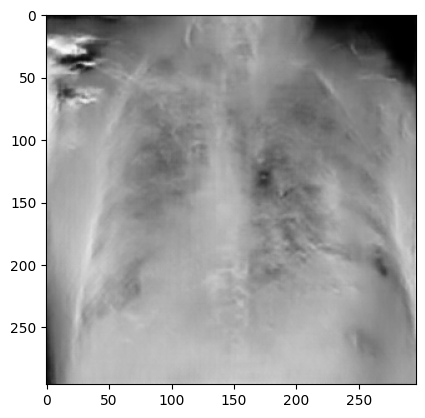

gen_loss tf.Tensor(2.8946362, shape=(), dtype=float32)
disc_loss tf.Tensor(0.81089115, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0096753, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8235913, shape=(), dtype=float32)
gen_loss tf.Tensor(2.179736, shape=(), dtype=float32)
disc_loss tf.Tensor(1.5954418, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7658101, shape=(), dtype=float32)
disc_loss tf.Tensor(0.30296075, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3571644, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3259976, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8866595, shape=(), dtype=float32)
disc_loss tf.Tensor(0.57607687, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1313639, shape=(), dtype=float32)
disc_loss tf.Tensor(0.59889406, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1235573, shape=(), dtype=float32)
disc_loss tf.Tensor(0.22456154, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4980285, shape=(), dtype=float32)
disc_loss tf.Tensor(0.46892154, shape=(), dtype=float

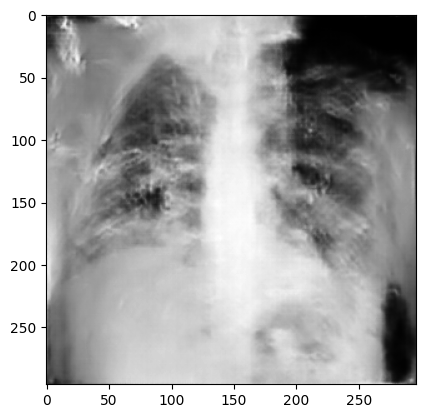

gen_loss tf.Tensor(2.50187, shape=(), dtype=float32)
disc_loss tf.Tensor(0.17878158, shape=(), dtype=float32)
gen_loss tf.Tensor(2.7635877, shape=(), dtype=float32)
disc_loss tf.Tensor(0.16534615, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8856614, shape=(), dtype=float32)
disc_loss tf.Tensor(0.08747718, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1995554, shape=(), dtype=float32)
disc_loss tf.Tensor(0.66179216, shape=(), dtype=float32)
gen_loss tf.Tensor(4.3695207, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1335263, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3864105, shape=(), dtype=float32)
disc_loss tf.Tensor(1.3146152, shape=(), dtype=float32)
gen_loss tf.Tensor(3.024813, shape=(), dtype=float32)
disc_loss tf.Tensor(0.12863027, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3509157, shape=(), dtype=float32)
disc_loss tf.Tensor(0.50811833, shape=(), dtype=float32)
gen_loss tf.Tensor(2.275571, shape=(), dtype=float32)
disc_loss tf.Tensor(0.57733583, shape=(), dtype=float32

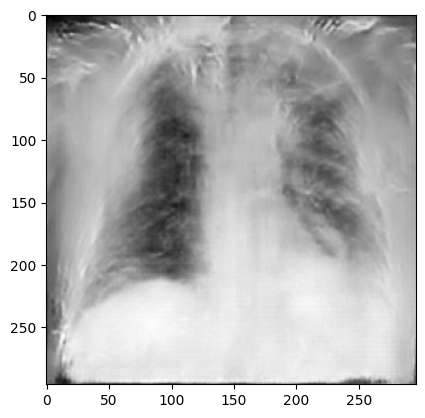

gen_loss tf.Tensor(3.1034794, shape=(), dtype=float32)
disc_loss tf.Tensor(0.28664494, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3125918, shape=(), dtype=float32)
disc_loss tf.Tensor(0.575675, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3576872, shape=(), dtype=float32)
disc_loss tf.Tensor(0.1654024, shape=(), dtype=float32)
gen_loss tf.Tensor(1.761445, shape=(), dtype=float32)
disc_loss tf.Tensor(1.105068, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9446405, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5486661, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6975079, shape=(), dtype=float32)
disc_loss tf.Tensor(0.31606936, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5623333, shape=(), dtype=float32)
disc_loss tf.Tensor(0.40733188, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0970135, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7434911, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1163082, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0536844, shape=(), dtype=float32)
g

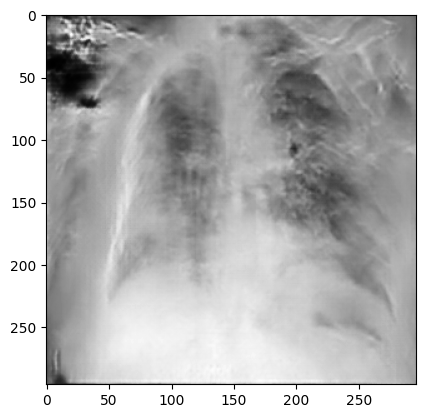

gen_loss tf.Tensor(2.2488558, shape=(), dtype=float32)
disc_loss tf.Tensor(0.25743863, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5356772, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0041406, shape=(), dtype=float32)
gen_loss tf.Tensor(3.8311386, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8852916, shape=(), dtype=float32)
gen_loss tf.Tensor(3.6044862, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8604662, shape=(), dtype=float32)
gen_loss tf.Tensor(3.4244578, shape=(), dtype=float32)
disc_loss tf.Tensor(0.11782414, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0971088, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5878659, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0521474, shape=(), dtype=float32)
disc_loss tf.Tensor(0.31629425, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5649251, shape=(), dtype=float32)
disc_loss tf.Tensor(0.80837905, shape=(), dtype=float32)
gen_loss tf.Tensor(1.7156811, shape=(), dtype=float32)
disc_loss tf.Tensor(0.32981193, shape=(), dtype=float

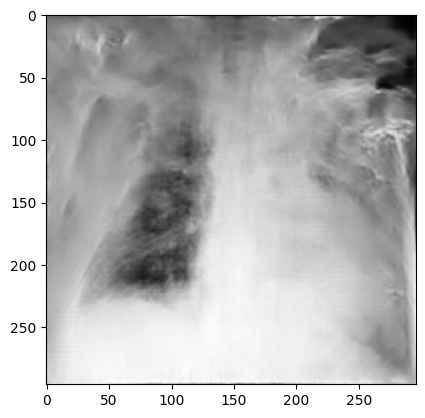

gen_loss tf.Tensor(5.1735854, shape=(), dtype=float32)
disc_loss tf.Tensor(0.06379082, shape=(), dtype=float32)
gen_loss tf.Tensor(5.6512084, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27012458, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2951546, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5653732, shape=(), dtype=float32)
gen_loss tf.Tensor(5.0087914, shape=(), dtype=float32)
disc_loss tf.Tensor(0.036173638, shape=(), dtype=float32)
gen_loss tf.Tensor(4.7731395, shape=(), dtype=float32)
disc_loss tf.Tensor(0.22178079, shape=(), dtype=float32)
gen_loss tf.Tensor(2.519965, shape=(), dtype=float32)
disc_loss tf.Tensor(0.1663667, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4578593, shape=(), dtype=float32)
disc_loss tf.Tensor(0.111719325, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9264667, shape=(), dtype=float32)
disc_loss tf.Tensor(0.16172637, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5071754, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5755243, shape=(), dtype=flo

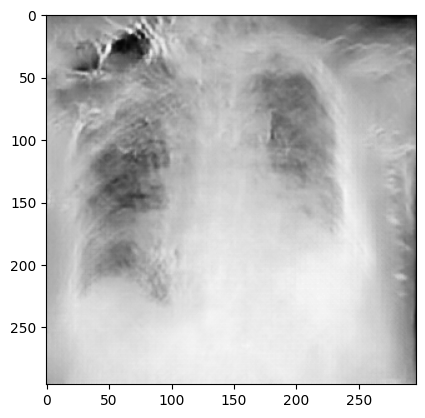

gen_loss tf.Tensor(1.603577, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1181589, shape=(), dtype=float32)
gen_loss tf.Tensor(2.728778, shape=(), dtype=float32)
disc_loss tf.Tensor(0.60818213, shape=(), dtype=float32)
gen_loss tf.Tensor(3.681404, shape=(), dtype=float32)
disc_loss tf.Tensor(2.1233284, shape=(), dtype=float32)
gen_loss tf.Tensor(2.326609, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8738374, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1406405, shape=(), dtype=float32)
disc_loss tf.Tensor(0.62804604, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0569503, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5538982, shape=(), dtype=float32)
gen_loss tf.Tensor(1.5709772, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6287904, shape=(), dtype=float32)
gen_loss tf.Tensor(1.726841, shape=(), dtype=float32)
disc_loss tf.Tensor(0.704757, shape=(), dtype=float32)
gen_loss tf.Tensor(2.067711, shape=(), dtype=float32)
disc_loss tf.Tensor(0.22148208, shape=(), dtype=float32)
gen_l

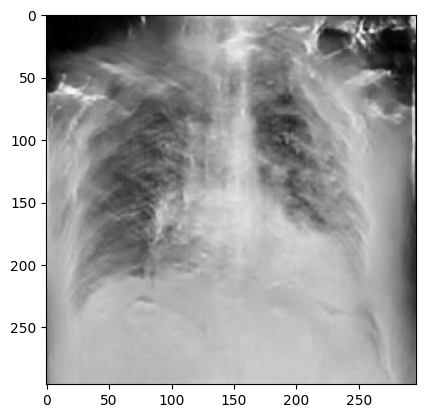

gen_loss tf.Tensor(2.6684048, shape=(), dtype=float32)
disc_loss tf.Tensor(0.28219274, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2727406, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2832073, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4186375, shape=(), dtype=float32)
disc_loss tf.Tensor(0.16864319, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5975864, shape=(), dtype=float32)
disc_loss tf.Tensor(0.18756026, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5572968, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2320942, shape=(), dtype=float32)
gen_loss tf.Tensor(4.0541635, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7822996, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3453352, shape=(), dtype=float32)
disc_loss tf.Tensor(0.42583874, shape=(), dtype=float32)
gen_loss tf.Tensor(4.0362954, shape=(), dtype=float32)
disc_loss tf.Tensor(0.30446804, shape=(), dtype=float32)
gen_loss tf.Tensor(3.963258, shape=(), dtype=float32)
disc_loss tf.Tensor(0.75451547, shape=(), dtype=float

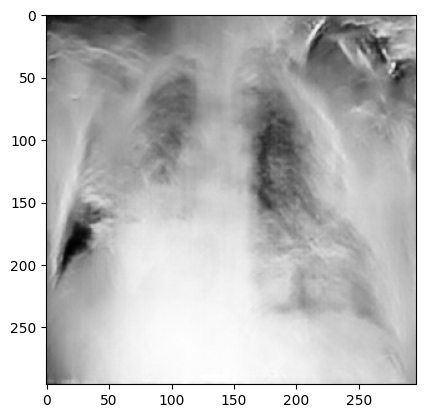

gen_loss tf.Tensor(3.258377, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8742142, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1443102, shape=(), dtype=float32)
disc_loss tf.Tensor(0.99107593, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1567867, shape=(), dtype=float32)
disc_loss tf.Tensor(0.83498394, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8233191, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8290451, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6787525, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3877225, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0750043, shape=(), dtype=float32)
disc_loss tf.Tensor(0.250348, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4724114, shape=(), dtype=float32)
disc_loss tf.Tensor(0.20553702, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2060156, shape=(), dtype=float32)
disc_loss tf.Tensor(0.11784544, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2441409, shape=(), dtype=float32)
disc_loss tf.Tensor(0.07601556, shape=(), dtype=float32

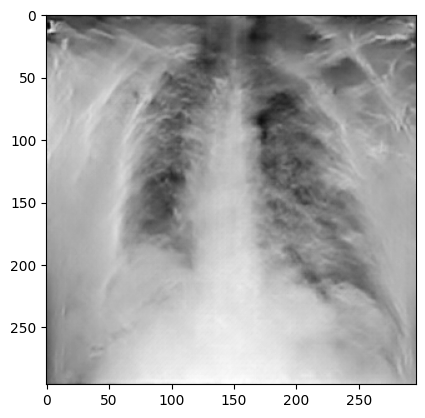

gen_loss tf.Tensor(1.9651446, shape=(), dtype=float32)
disc_loss tf.Tensor(1.0775173, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6912259, shape=(), dtype=float32)
disc_loss tf.Tensor(1.4501675, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0729253, shape=(), dtype=float32)
disc_loss tf.Tensor(1.5069996, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1606715, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3894656, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1901653, shape=(), dtype=float32)
disc_loss tf.Tensor(0.121902354, shape=(), dtype=float32)
gen_loss tf.Tensor(3.9764614, shape=(), dtype=float32)
disc_loss tf.Tensor(0.60137165, shape=(), dtype=float32)
gen_loss tf.Tensor(3.5160592, shape=(), dtype=float32)
disc_loss tf.Tensor(0.72379106, shape=(), dtype=float32)
gen_loss tf.Tensor(4.222807, shape=(), dtype=float32)
disc_loss tf.Tensor(0.26260802, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9385846, shape=(), dtype=float32)
disc_loss tf.Tensor(1.2138307, shape=(), dtype=float3

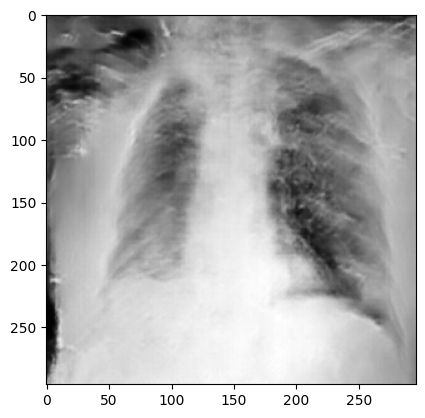

gen_loss tf.Tensor(4.0436244, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8227341, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2581556, shape=(), dtype=float32)
disc_loss tf.Tensor(0.27002418, shape=(), dtype=float32)
gen_loss tf.Tensor(3.1076138, shape=(), dtype=float32)
disc_loss tf.Tensor(0.08089183, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2944129, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4969472, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2476711, shape=(), dtype=float32)
disc_loss tf.Tensor(0.23525289, shape=(), dtype=float32)
gen_loss tf.Tensor(2.4565115, shape=(), dtype=float32)
disc_loss tf.Tensor(0.44103104, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2929215, shape=(), dtype=float32)
disc_loss tf.Tensor(0.29365078, shape=(), dtype=float32)
gen_loss tf.Tensor(2.9011805, shape=(), dtype=float32)
disc_loss tf.Tensor(0.37038255, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6029046, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2960063, shape=(), dtype=floa

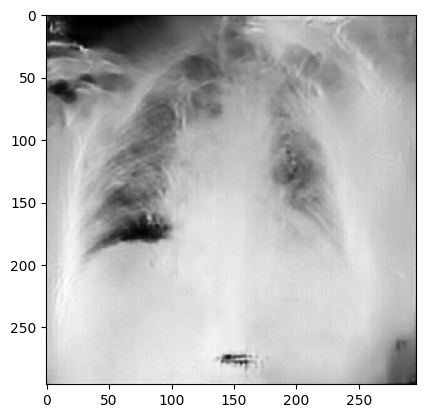

gen_loss tf.Tensor(4.4057665, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7473649, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3398888, shape=(), dtype=float32)
disc_loss tf.Tensor(0.47642678, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2458096, shape=(), dtype=float32)
disc_loss tf.Tensor(0.18734512, shape=(), dtype=float32)
gen_loss tf.Tensor(2.306862, shape=(), dtype=float32)
disc_loss tf.Tensor(1.2717564, shape=(), dtype=float32)
gen_loss tf.Tensor(1.4795674, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7005236, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6872638, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6109274, shape=(), dtype=float32)
gen_loss tf.Tensor(1.3684174, shape=(), dtype=float32)
disc_loss tf.Tensor(0.4926625, shape=(), dtype=float32)
gen_loss tf.Tensor(1.9918799, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3110154, shape=(), dtype=float32)
gen_loss tf.Tensor(3.6924875, shape=(), dtype=float32)
disc_loss tf.Tensor(0.07525134, shape=(), dtype=float32)

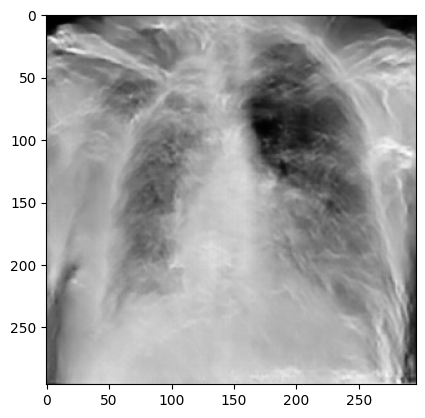

gen_loss tf.Tensor(4.7327456, shape=(), dtype=float32)
disc_loss tf.Tensor(0.50332403, shape=(), dtype=float32)
gen_loss tf.Tensor(3.8883698, shape=(), dtype=float32)
disc_loss tf.Tensor(0.057694446, shape=(), dtype=float32)
gen_loss tf.Tensor(4.7177577, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2909386, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2523432, shape=(), dtype=float32)
disc_loss tf.Tensor(0.8218611, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0980794, shape=(), dtype=float32)
disc_loss tf.Tensor(0.34709084, shape=(), dtype=float32)
gen_loss tf.Tensor(2.7118313, shape=(), dtype=float32)
disc_loss tf.Tensor(0.14442924, shape=(), dtype=float32)
gen_loss tf.Tensor(2.3784134, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3326415, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2794402, shape=(), dtype=float32)
disc_loss tf.Tensor(0.3942083, shape=(), dtype=float32)
gen_loss tf.Tensor(2.1407788, shape=(), dtype=float32)
disc_loss tf.Tensor(0.25462848, shape=(), dtype=floa

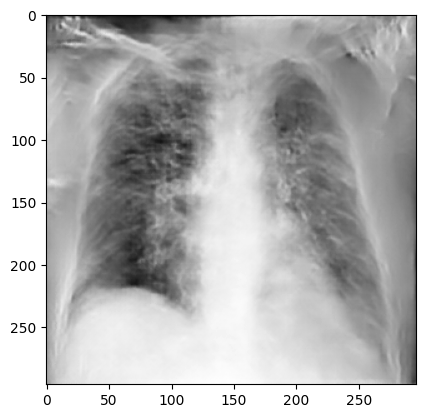

gen_loss tf.Tensor(3.7990854, shape=(), dtype=float32)
disc_loss tf.Tensor(0.22122303, shape=(), dtype=float32)
gen_loss tf.Tensor(3.659375, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2828369, shape=(), dtype=float32)
gen_loss tf.Tensor(3.8826342, shape=(), dtype=float32)
disc_loss tf.Tensor(1.6706215, shape=(), dtype=float32)
gen_loss tf.Tensor(2.8720863, shape=(), dtype=float32)
disc_loss tf.Tensor(0.19164394, shape=(), dtype=float32)
gen_loss tf.Tensor(3.228461, shape=(), dtype=float32)
disc_loss tf.Tensor(0.64397645, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8583306, shape=(), dtype=float32)
disc_loss tf.Tensor(0.93853676, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8677181, shape=(), dtype=float32)
disc_loss tf.Tensor(0.37077343, shape=(), dtype=float32)
gen_loss tf.Tensor(1.8912468, shape=(), dtype=float32)
disc_loss tf.Tensor(0.33018047, shape=(), dtype=float32)
gen_loss tf.Tensor(2.5037582, shape=(), dtype=float32)
disc_loss tf.Tensor(0.87009794, shape=(), dtype=float

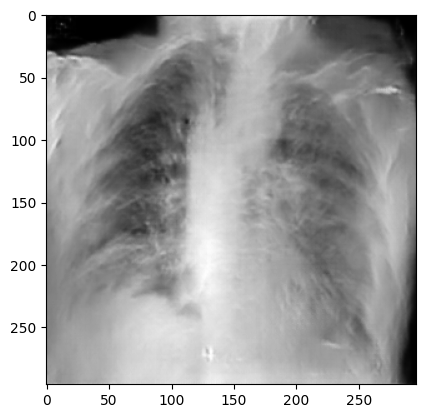

gen_loss tf.Tensor(2.8498495, shape=(), dtype=float32)
disc_loss tf.Tensor(0.2278125, shape=(), dtype=float32)
gen_loss tf.Tensor(3.0731144, shape=(), dtype=float32)
disc_loss tf.Tensor(0.309882, shape=(), dtype=float32)
gen_loss tf.Tensor(3.7286313, shape=(), dtype=float32)
disc_loss tf.Tensor(0.71364367, shape=(), dtype=float32)
gen_loss tf.Tensor(3.635418, shape=(), dtype=float32)
disc_loss tf.Tensor(0.13282852, shape=(), dtype=float32)
gen_loss tf.Tensor(3.141641, shape=(), dtype=float32)
disc_loss tf.Tensor(0.14072059, shape=(), dtype=float32)
gen_loss tf.Tensor(3.7019198, shape=(), dtype=float32)
disc_loss tf.Tensor(0.058037896, shape=(), dtype=float32)
gen_loss tf.Tensor(3.8752882, shape=(), dtype=float32)
disc_loss tf.Tensor(0.35518673, shape=(), dtype=float32)
gen_loss tf.Tensor(4.1952987, shape=(), dtype=float32)
disc_loss tf.Tensor(0.30274498, shape=(), dtype=float32)
gen_loss tf.Tensor(3.5856583, shape=(), dtype=float32)
disc_loss tf.Tensor(0.33941838, shape=(), dtype=float

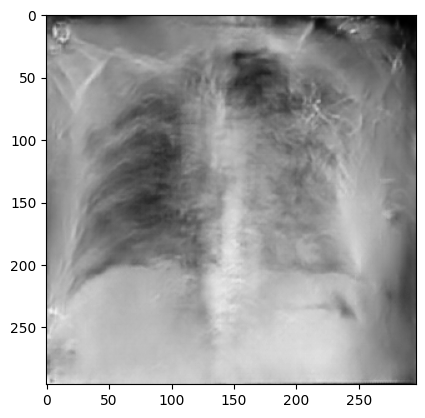

gen_loss tf.Tensor(3.190915, shape=(), dtype=float32)
disc_loss tf.Tensor(0.42609337, shape=(), dtype=float32)
gen_loss tf.Tensor(1.879242, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5306266, shape=(), dtype=float32)
gen_loss tf.Tensor(2.2639058, shape=(), dtype=float32)
disc_loss tf.Tensor(0.42597803, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0991666, shape=(), dtype=float32)
disc_loss tf.Tensor(1.1867418, shape=(), dtype=float32)
gen_loss tf.Tensor(1.6419352, shape=(), dtype=float32)
disc_loss tf.Tensor(0.6901958, shape=(), dtype=float32)
gen_loss tf.Tensor(2.0481465, shape=(), dtype=float32)
disc_loss tf.Tensor(0.48792806, shape=(), dtype=float32)
gen_loss tf.Tensor(3.2044237, shape=(), dtype=float32)
disc_loss tf.Tensor(0.21221355, shape=(), dtype=float32)
gen_loss tf.Tensor(2.6260793, shape=(), dtype=float32)
disc_loss tf.Tensor(0.68765104, shape=(), dtype=float32)
gen_loss tf.Tensor(3.7191057, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5101067, shape=(), dtype=float32

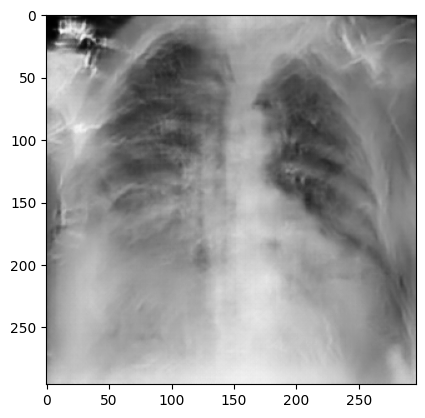

gen_loss tf.Tensor(3.8452313, shape=(), dtype=float32)
disc_loss tf.Tensor(0.34269425, shape=(), dtype=float32)
gen_loss tf.Tensor(3.7581558, shape=(), dtype=float32)
disc_loss tf.Tensor(0.1162409, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3837318, shape=(), dtype=float32)
disc_loss tf.Tensor(0.07406902, shape=(), dtype=float32)
gen_loss tf.Tensor(4.524226, shape=(), dtype=float32)
disc_loss tf.Tensor(0.7504939, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3688576, shape=(), dtype=float32)
disc_loss tf.Tensor(0.15229604, shape=(), dtype=float32)
gen_loss tf.Tensor(1.4636325, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5762247, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3623903, shape=(), dtype=float32)
disc_loss tf.Tensor(0.07199192, shape=(), dtype=float32)
gen_loss tf.Tensor(2.51249, shape=(), dtype=float32)
disc_loss tf.Tensor(0.26592407, shape=(), dtype=float32)
gen_loss tf.Tensor(3.3824031, shape=(), dtype=float32)
disc_loss tf.Tensor(0.5581269, shape=(), dtype=float32)

In [15]:
%%time
# Train the GAN model
train(dataset, EPOCHS)